# Import of Libraries

In [1]:
import os
import cv2
import numpy as np
import glob
import time
import matplotlib.pyplot as plt
import pandas as pd

# Exercises Resolution

## 1. Calibrate the intrinsic parameters and lens distortion of the camera. Show the intrinsic matrix and the lens distortion coefficients (appear in section 3).
## 2. Calibrate the extrinsic parameters of the camera setup (or instead, use the  extrinsic  image  to  manually  measure  the  dimensions  of  a  black square  of  the  chessboard  in  pixels.  In  this  way,  you  will  know  the conversion between pixel to millimeter). Show the extrinsic matrix (rotation,  translation,  etc)  and/or  the  conversion  ratio  between  pixel to millimeter that was used (appear in section 3).

In [3]:
def DetectChessboardCorners(num_cols, num_rows, images):
    
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((num_cols * num_rows, 3), np.float32)
    objp[:,:2] = np.mgrid[0:num_cols, 0:num_rows].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (num_cols, num_rows), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            cv2.drawChessboardCorners(img, (num_cols, num_rows), corners, ret)
            plt.imshow(img)
            plt.show()
            time.sleep(1)

    return objpoints, imgpoints


def DistortedVSNonDistorted(objpoints, imgpoints, image):

    img_size = (image.shape[1], image.shape[0])

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

    dst = cv2.undistort(image, mtx, dist, None, mtx)

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)

    return mtx, dist, rvecs, tvecs

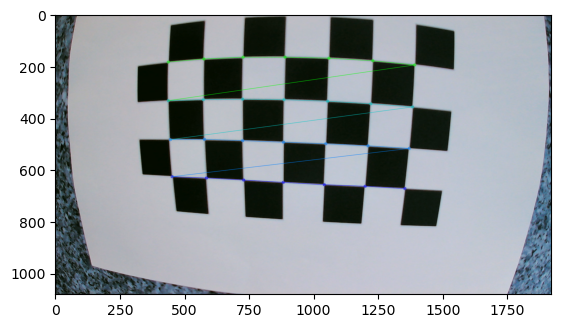

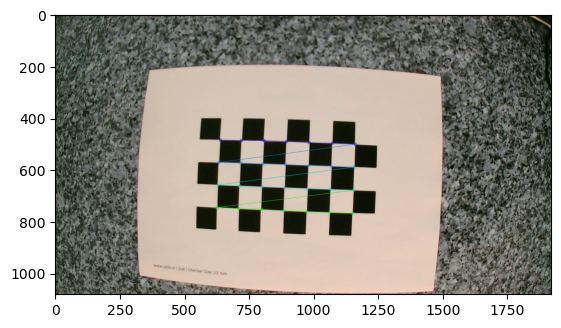

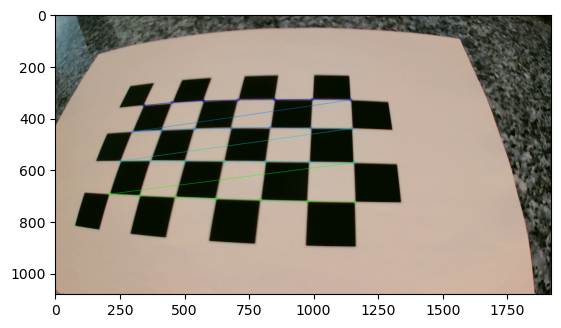

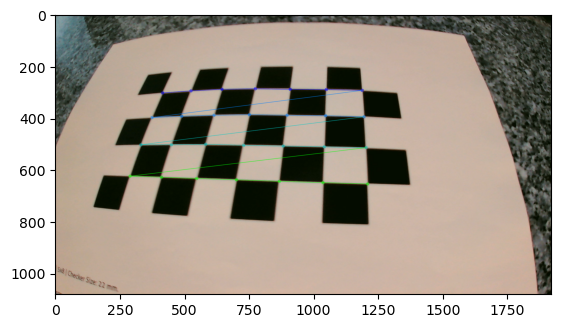

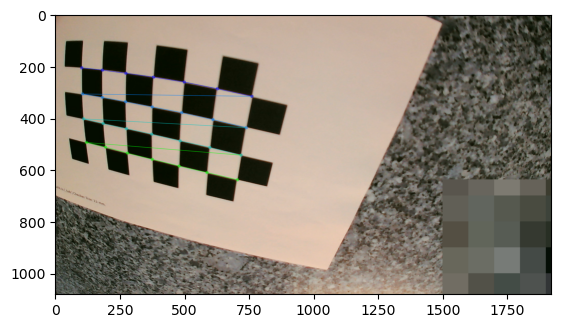

...

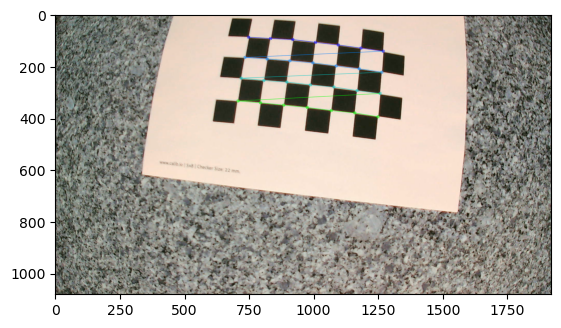

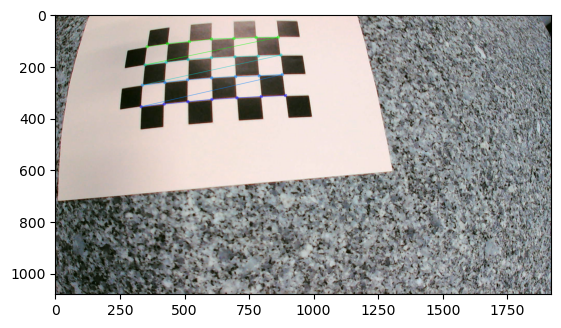

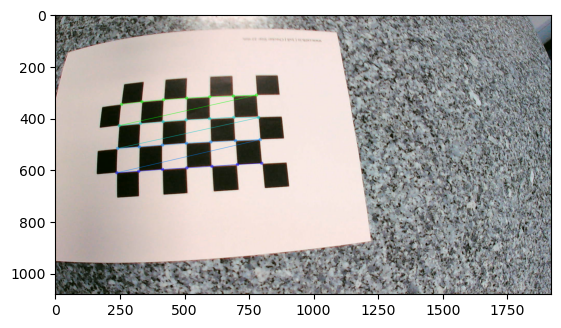

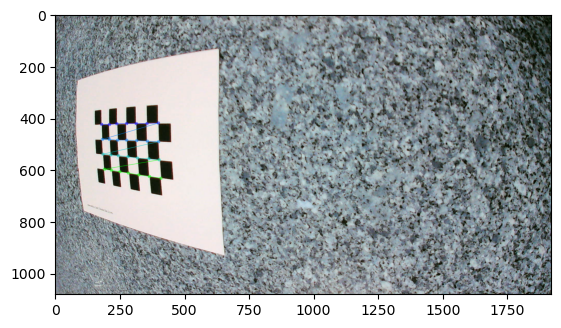

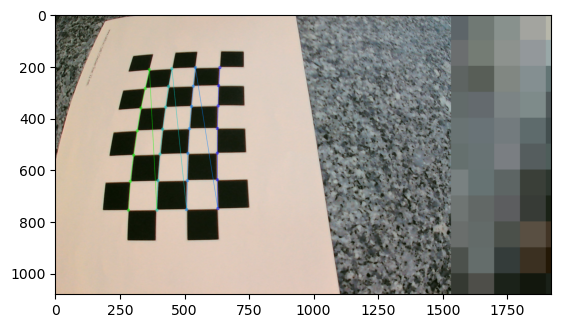

In [4]:
# Make a list of calibration images
images = glob.glob('IntrinsicCalibration/*.png')

objpoints, imgpoints = DetectChessboardCorners(num_cols = 7, num_rows = 4, images = images)

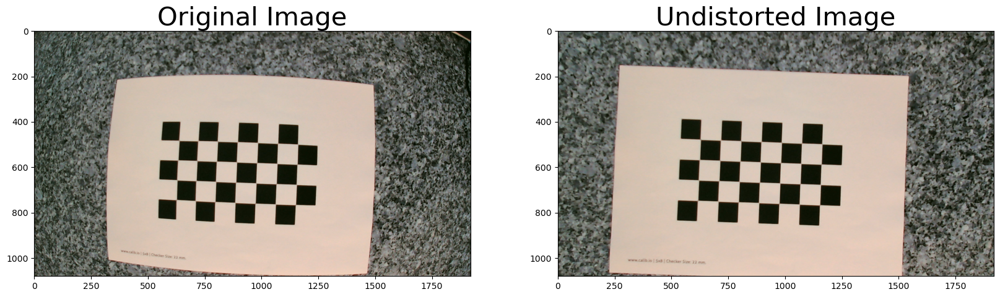

In [5]:
img = cv2.imread('IntrinsicCalibration/calib_img 1.png')

intrinsic_matrix, dist_coef, rotation_vectors, translation_vectors = DistortedVSNonDistorted(objpoints = objpoints, imgpoints = imgpoints, image = img)

## 3. Consider only the images retrieved from a White Background. Implement the functions described above.

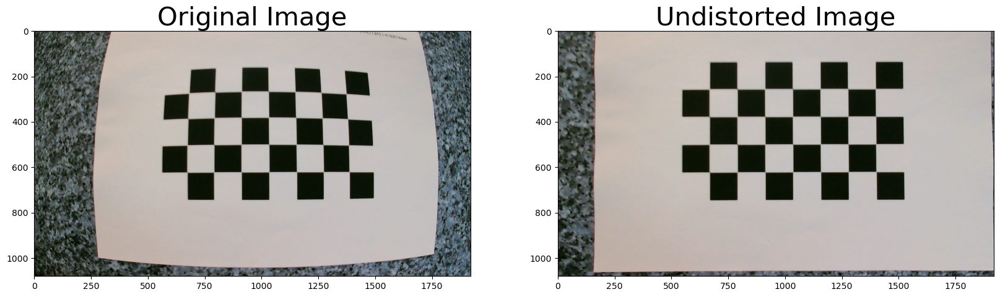

In [10]:
image_extrinsic = cv2.imread('WhiteBackground/extrinsic.png')

intrinsic_matrix_white, dist_coef_white, rotation_vectors_white, translation_vectors_white = DistortedVSNonDistorted(objpoints = objpoints, imgpoints = imgpoints, image = image_extrinsic)

In [11]:
# The intrisinc matrix obtained from the intrinsic images
intrinsic_matrix

array([[1.32389884e+03, 0.00000000e+00, 9.91163276e+02],
       [0.00000000e+00, 1.32475673e+03, 6.34400622e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

In [12]:
# The distortion coefficient obtained from the intrinsic images
dist_coef

array([[-0.35173525,  0.10764796,  0.00061637, -0.00041242, -0.01338397]])

In [13]:
# The rotation vectors obtained from the extrinsic images
rotation_vectors_white

(array([[-0.09432489],
        [ 0.47580594],
        [-3.06212448]]),
 array([[-0.01878147],
        [ 0.00144976],
        [ 0.03762902]]),
 array([[-0.55938325],
        [ 0.03369091],
        [ 0.02950494]]),
 array([[-0.54860666],
        [ 0.03676537],
        [ 0.04274333]]),
 array([[ 0.67229551],
        [-0.05029134],
        [ 0.26485505]]),
 array([[0.53913323],
        [0.25092755],
        [0.28354332]]),
 array([[ 0.69552793],
        [ 0.20437428],
        [-0.47393294]]),
 array([[-0.08914723],
        [-0.07166743],
        [ 0.41880352]]),
 array([[ 0.69922291],
        [ 0.22023012],
        [-0.50029114]]),
 array([[-0.65805277],
        [ 0.15190717],
        [ 1.11700972]]),
 array([[-0.04060195],
        [-0.04158807],
        [ 3.0032799 ]]),
 array([[-0.09735861],
        [ 0.15916209],
        [ 0.64669015]]),
 array([[ 0.99726004],
        [ 0.17659861],
        [-1.42405784]]),
 array([[-1.20144573],
        [ 0.61104999],
        [ 2.64980889]]),
 array([[

In [14]:
# The translation vectors obtained from the extrinsic images
translation_vectors_white

(array([[2.30580697],
        [0.23933022],
        [8.18683516]]),
 array([[-4.07308605],
        [-1.72083409],
        [14.85231112]]),
 array([[-4.95955275],
        [-2.16110003],
        [ 8.96904645]]),
 array([[-4.56932372],
        [-2.62201987],
        [ 9.47585294]]),
 array([[-7.39232904],
        [-3.56917699],
        [ 8.18060131]]),
 array([[-3.33919132],
        [-2.13840532],
        [10.45934422]]),
 array([[-3.75296877],
        [-1.06707663],
        [10.54499964]]),
 array([[-5.67206849],
        [-1.0558588 ],
        [15.17852862]]),
 array([[-5.36149742],
        [-1.5840264 ],
        [11.91273386]]),
 array([[-4.63222961],
        [-4.69501982],
        [10.9641268 ]]),
 array([[-2.091168  ],
        [-1.41236536],
        [11.79784611]]),
 array([[-4.77084123],
        [-5.92758101],
        [13.48103838]]),
 array([[-2.53604715],
        [ 1.13364426],
        [12.69182509]]),
 array([[ 1.57801523],
        [-0.92231154],
        [13.11646604]]),
 array([[

### 3.1 Define a ROI (region of interest) for the image

In [2]:
def process_image(image_path, intrinsic_matrix, dist_coef, output_folder):
    img = cv2.imread(image_path)
    h, w = img.shape[:2]
    newcameramtx, roi = cv2.getOptimalNewCameraMatrix(intrinsic_matrix, dist_coef, (w, h), 1, (w, h))

    # undistort
    dst = cv2.undistort(img, intrinsic_matrix, dist_coef, None, newcameramtx)
    
    # crop the image
    x, y, w, h = roi
    dst = dst[y:y + h, x:x + w]

    filename = os.path.basename(image_path)
    output_path = os.path.join(output_folder, filename)
    cv2.imwrite(output_path, dst)
    #cv2.imshow('Image',dst)

In [ ]:
# Provide the path to the 'WhiteBackground' folder
folder_path = 'WhiteBackground'

# Provide the path to the output folder
output_folder = 'WhiteBackground_Undistorted'

# Loop through images in the folder and process each one
for filename in os.listdir(folder_path):
    if filename.endswith(".png"):
        img_path = os.path.join(folder_path, filename)
        process_image(img_path, intrinsic_matrix, dist_coef, output_folder)

In [78]:
def DefineROI(image_path):
    #Remove the granite table
    img = cv2.imread(image_path)
    #img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    #define ROI
    img = img[10:700, 300:1300]

    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("ROI")
    plt.show()

    filename = os.path.basename(image_path)
    output_path = os.path.join(output_folder, filename)
    cv2.imwrite(output_path, img)

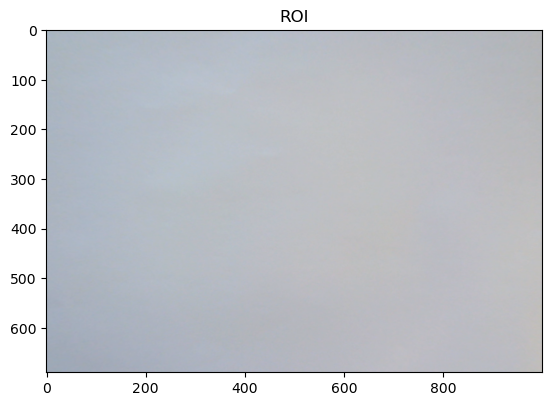

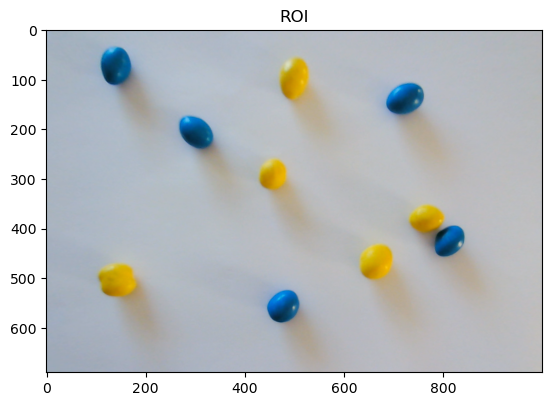

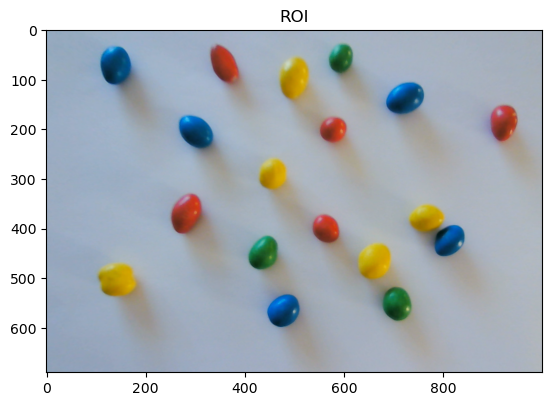

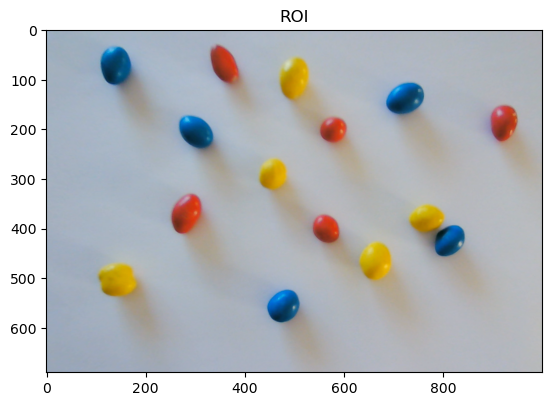

In [79]:
# Provide the path to the 'WhiteBackground' folder
folder_path = 'WhiteBackground_Undistorted'

# Provide the path to the output folder
output_folder = 'WhiteBackground_ROI'

# Loop through images in the folder and process each one
for filename in os.listdir(folder_path):
    if filename.endswith(".png"):
        img_path = os.path.join(folder_path, filename)
        DefineROI(img_path)

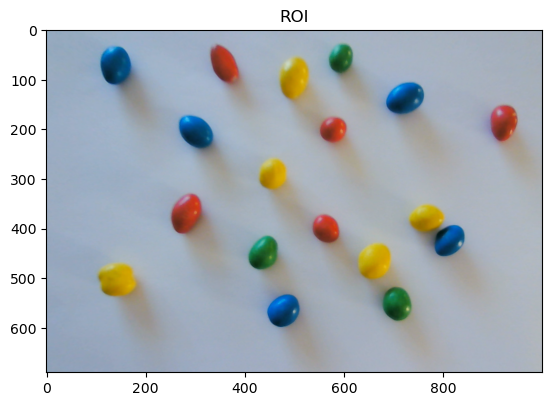

In [75]:
#Remove the granite table
img = cv2.imread('WhiteBackground_Undistorted/calib_img 3.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#define ROI
img = img[10:700, 300:1300]

plt.imshow(img)
plt.title("ROI")
plt.show()

### 3.2 Calculate the number of M&M per color for all images provided

In [2]:
def DetectMMS(image, show = False):

    img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Converta a imagem para o espaço de cores HSV
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    color_codes_hsv = {
        'yellow': {
            'lower': (90, 100, 50),
            'upper': (100, 255, 255)
        },
        'blue': {
            'lower': (0, 100, 50),
            'upper': (30, 255, 255)
        },
        'red': {
            'lower': (110, 100, 50),
            'upper': (140, 255, 255)
        },
        'green': {
            'lower': (31, 100, 50),
            'upper': (89, 255, 255)
        }
    }

    color_codes_rgb = {'yellow': (255, 255, 0),
                       'blue': (0, 0, 255),
                       'red': (255, 0, 0),
                       'green': (0, 255, 0)
                       }
    
    mms = {}

    for color in ['blue', 'yellow', 'red', 'green']:
        # Defina os limites inferior e superior da cor
        lower = color_codes_hsv[color]['lower']
        upper = color_codes_hsv[color]['upper']

        # Crie uma máscara para a cor
        mask = cv2.inRange(img_hsv, lower, upper)
        kernel = np.ones((5, 5), np.uint8)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)       

        # Aplique a máscara na imagem original
        result = cv2.bitwise_or(img, img, mask = mask)

        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        min_contour_area = 100  # Adjust this threshold as needed
        mms[color] = []
        for contour in contours:
            if cv2.contourArea(contour) > min_contour_area:
                mms[color].append(contour)

        for contour in mms[color]:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(img, (x, y), (x + w, y + h), color_codes_rgb[color], 2)

    if show:
        plt.imshow(img)
        plt.title("M&M Detection")
        plt.show()

    return mms


def ComputeNumberMMS(contours):

    yellow_count = len(contours['yellow'])
    blue_count = len(contours['blue'])
    red_count = len(contours['red'])
    green_count = len(contours['green'])

    print(f"Number of yellow M&M's detected: {yellow_count}")
    print(f"Number of blue M&M's detected: {blue_count}")
    print(f"Number of red M&M's detected: {red_count}")
    print(f"Number of green M&M's detected: {green_count}")

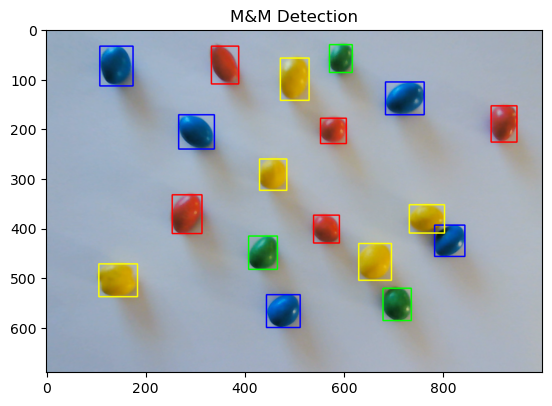

Number of yellow M&M's detected: 5
Number of blue M&M's detected: 5
Number of red M&M's detected: 5
Number of green M&M's detected: 3


In [3]:
img = cv2.imread('WhiteBackground_ROI/calib_img 3.png')

mms_detected = DetectMMS(image = img, show = True)
ComputeNumberMMS(mms_detected)

### 3.3 Determine the average area for peanuts in pixels, considering the image “calib_img 3”

In [19]:
def ComputeAreaPixelsMMS(contours):
    areas = []
    for color in ['blue', 'yellow', 'red', 'green']:
        for contour in contours[color]:
            areas.append(cv2.contourArea(contour))

    return round(np.mean(areas), 2)

In [20]:
img = cv2.imread('WhiteBackground_ROI/calib_img 3.png')
mms_detected_image3 = DetectMMS(image = img)

average_area = ComputeAreaPixelsMMS(mms_detected_image3)
print(f'Average M&M area in pixels: {average_area}')

Average M&M area in pixels: 3017.72


<h4> 3.3.2 Discuss the limitations of the peanut detection method used (in 2 sentences) </h4>

Regarding the limitations of the peanut detection method, it is important to note that:
1. Detection accuracy depends on lighting, contrast, and image quality.
2. The method used in this code assumes that peanuts are distinct and well-isolated objects, which may not be the case in real situations where peanuts may be close together or partially overlapping.

### 3.4 Determine the average area (and standard deviation) for peanuts in millimeters and grouped by color, considering images “calib_img 2” and “calib_img 3”

<h4> 3.4.1 Show  the  result  in  a  table  color  vs  area  and  standard deviation </h4>

In [31]:
def ComputeAreaMetricMMS(contours, conversion_factor = 0.005):
    areas = {}
    for color in ['blue', 'yellow', 'red', 'green']:
        areas[color] = []
        for contour in contours[color]:
            areas[color].append(cv2.contourArea(contour))

    # create a dictionary with the mean and standard deviation of the areas
    areas_mm = {}
    std_mm = {}
    for color in ['blue', 'yellow', 'red', 'green']:
        areas_mm[color] = round(np.mean(areas[color]) * conversion_factor, 2)
        std_mm[color] = round(np.std(areas[color]) * conversion_factor, 2)

    return areas_mm, std_mm

In [45]:
img = cv2.imread('WhiteBackground_ROI/calib_img 3.png')
mms_detected_image3 = DetectMMS(image = img)

areas_mm, std_mm = ComputeAreaMetricMMS(mms_detected_image3)
results = pd.DataFrame(areas_mm, index = ['Area (mm^2)'])
results.loc['Standard deviation (mm^2)'] = std_mm

display(results.T)

,Area (mm^2),Standard deviation (mm^2)
blue,17.22,2.55
yellow,16.98,2.50
red,12.74,2.24
green,12.28,1.84


In [46]:
img = cv2.imread('WhiteBackground_ROI/calib_img 2.png')
mms_detected_image3 = DetectMMS(image = img)

areas_mm, std_mm = ComputeAreaMetricMMS(mms_detected_image3)
results = pd.DataFrame(areas_mm, index = ['Area (mm^2)'])
results.loc['Standard deviation (mm^2)'] = std_mm

display(results.T)

/Users/luish/anaconda3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/luish/anaconda3/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/luish/anaconda3/lib/python3.10/site-packages/numpy/core/_methods.py:264: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/luish/anaconda3/lib/python3.10/site-packages/numpy/core/_methods.py:222: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/Users/luish/anaconda3/lib/python3.10/site-packages/numpy/core/_methods.py:256: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Area (mm^2),Standard deviation (mm^2)
blue,16.80,2.29
yellow,17.27,2.65
red,12.84,2.25
green,NaN,NaN


<h4> 3.4.2 Discuss  the  limitation  of  the  method  implemented  (in  2 sentences) </h4>

The limitations of the implemented method are as follows:
1. Sensitivity to lighting conditions may affect color detection accuracy;
2. Potential inaccuracies in contour detection due to variations in peanut shapes may impact area calculations;
3. The method assumes uniformity of peanut size, which may not hold in real-world scenarios and potentially affects standard deviation estimates.

### 3.5 Provide some recommendations that the M&M factory should take into  consideration to  improve  the  performance  of  the quality assurance  process  based  on  image  processing  (e.g.,  imaging setup, calibration process and photometric effects), in 4 sentences.

To enhance the performance of the quality assurance process based on image processing, the M&M factory should consider several key recommendations:
1. Optimizing the imaging setup is crucial; this includes ensuring consistent and uniform lighting conditions and employing high-resolution cameras to capture detailed images. 
2. A meticulous calibration process is essential for accurate measurements, and regular recalibration should be scheduled to account for any drift or changes in the system. 
3. Implementing advanced image processing techniques, such as machine learning algorithms, can improve the accuracy and robustness of peanut detection and color classification. 
4. Addressing photometric effects, like glare or reflections, through the use of polarizers or controlled lighting setups can significantly enhance the reliability of the quality assurance process.